Importing all the libraries required for EDA

In [1]:
import pandas as pd
import numpy as np
import sweetviz as sv
import dtale
import dtale.app as dtale_app
dtale_app.USE_COLAB = True
import matplotlib.pyplot as plt
import seaborn as sns
#from autoviz.AutoViz_Class import AutoViz_Class
#from autoviz import FixDQ

Loading the combined dataset that we created in data pre-processing stage for Exploratary data analysis

In [2]:
simd = pd.read_csv('./../data/processed_data/combined_dataset.csv')


Using Dtale for Initial level of understanding for simd dataset

In [3]:
dtale_combined_dataset = dtale.show(simd)
dtale_combined_dataset.open_browser()

2023-11-26 11:50:17,715 - INFO     - Executing shutdown...
2023-11-26 11:50:17,718 - INFO     - Not running with the Werkzeug Server, exiting by searching gc for BaseWSGIServer


From the Initial understanding we figured out that we should plot a correlation matrix for the dataset

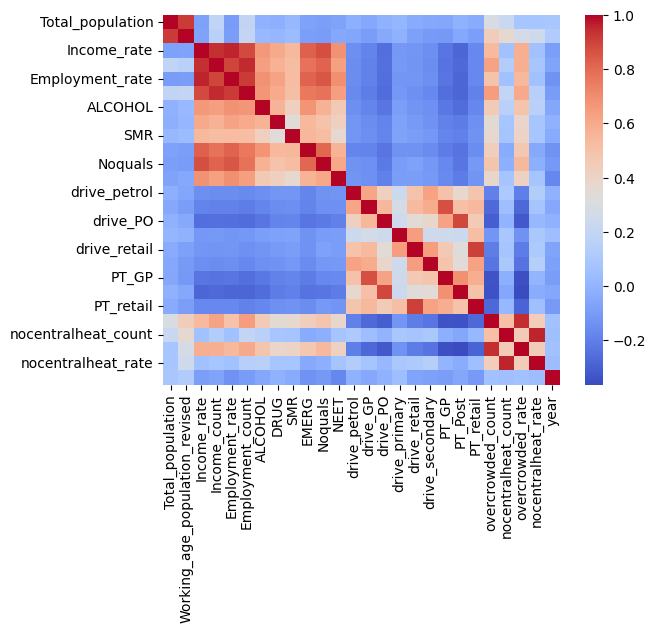

<Figure size 1800x1600 with 0 Axes>

In [4]:
numeric_columns = simd.select_dtypes(include=['int', 'float']).columns.tolist()
numeric_columns
corr_simd=simd.copy()
corr_simd=corr_simd[numeric_columns]
corr_matrix = corr_simd.corr()

# Create a heatmap
sns.heatmap(corr_matrix, cmap='coolwarm')

# Show the plot
plt.figure(figsize=(18,16))
plt.show()

Using correlation matrix and our analysis from Dtale we found these factors to be especially useful.
1) Income_rate
2) DRUG
3) ALCOHOL

as it can be observed that these seem to be influenced by the employment rate.

Employment_rate Income_rate
Employment_rate DRUG
Employment_rate ALCOHOL


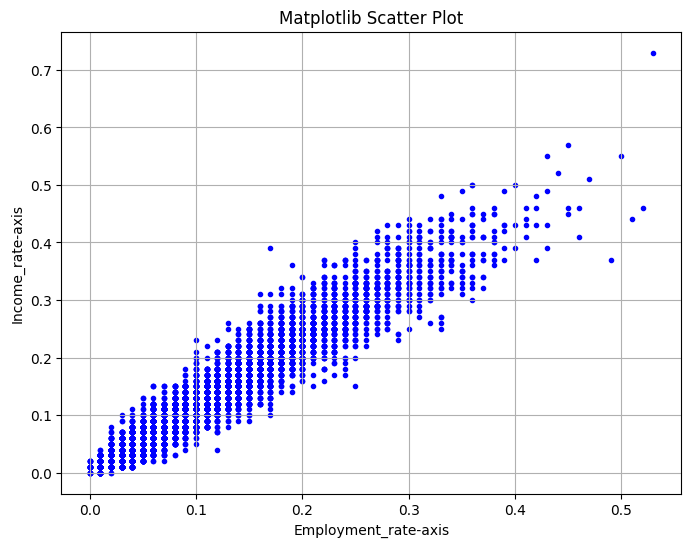

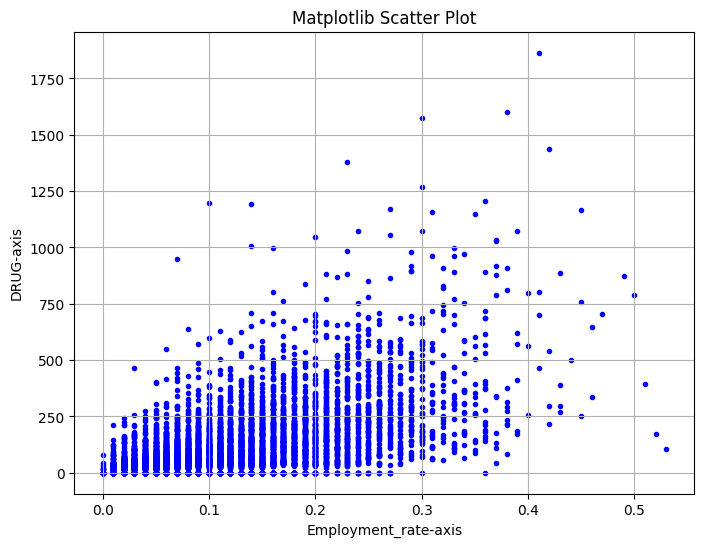

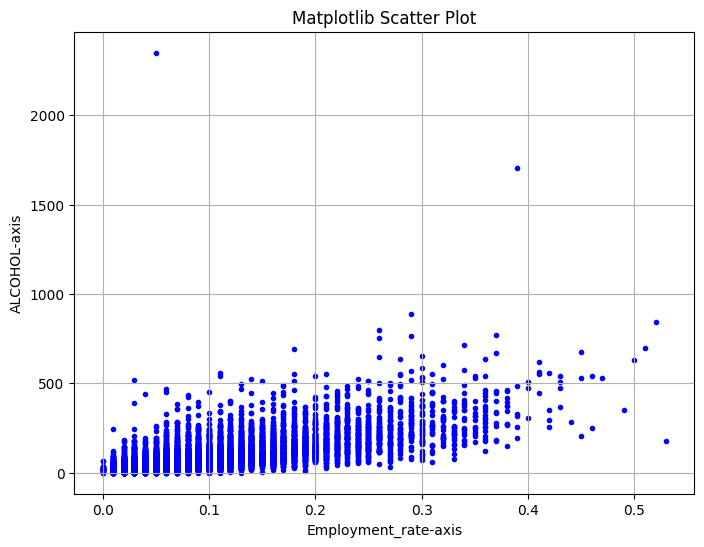

In [8]:


df = pd.DataFrame(simd)

list_of_columns=[["Employment_rate","Income_rate"],["Employment_rate","DRUG"],["Employment_rate","ALCOHOL"]]

for combination in list_of_columns:

    var1=combination[0]
    var2=combination[1]
    print(var1,var2)
    # Matplotlib Scatter Plot
    plt.figure(figsize=(8, 6))
    plt.scatter(df[var1], df[var2], color='blue', marker='.')
    plt.title('Matplotlib Scatter Plot')
    plt.xlabel(var1+'-axis')
    plt.ylabel(var2+'-axis')
    plt.grid(True)


We removed the records that had more than 80% of data missing

In [9]:
def clean_sparse_data(df,threshold):
    if not isinstance(df, pd.DataFrame):
        print("Invalid argument. Please provide a pandas dataframe.")
        return
    
    return df[df.apply(lambda x: (x.isnull().sum()/len(df.columns))*100 <= threshold, axis=1)]

simd_result=clean_sparse_data(simd,80)
simd_result.head()

,Data_Zone,Intermediate_Zone,Council_area,Total_population,Working_age_population_revised,Income_rate,Income_count,Employment_rate,Employment_count,CIF,...,PT_GP,PT_Post,PT_retail,crime_count,crime_rate,overcrowded_count,nocentralheat_count,overcrowded_rate,nocentralheat_rate,year
0,S01006506,Culter,Aberdeen City,904.0,605.0,0.07,60.0,0.07,40.0,60,...,8.437832,5.987087,5.711433,8.00642939150402,88.5666968086728,87.0,10.0,0.102113,0.011737,2016
1,S01006507,Culter,Aberdeen City,830.0,491.0,0.07,60.0,0.05,25.0,40,...,8.331833,7.262817,6.794300,4.00321469575201,48.2315023584579,85.0,4.0,0.101675,0.004785,2016
2,S01006508,Culter,Aberdeen City,694.0,519.0,0.05,30.0,0.03,15.0,45,...,7.853631,5.827924,5.251454,4.00321469575201,57.6832088725073,31.0,8.0,0.048212,0.012442,2016
3,S01006509,Culter,Aberdeen City,573.0,354.0,0.05,30.0,0.06,20.0,65,...,7.434491,8.311862,8.444698,*,*,42.0,6.0,0.072414,0.010345,2016
4,S01006510,Culter,Aberdeen City,676.0,414.0,0.10,70.0,0.07,30.0,75,...,5.141013,6.627376,6.619130,12.009644087256,177.657456912071,50.0,7.0,0.086655,0.012132,2016


We plot histograms for income rate, drug usage and Alcohol consumption

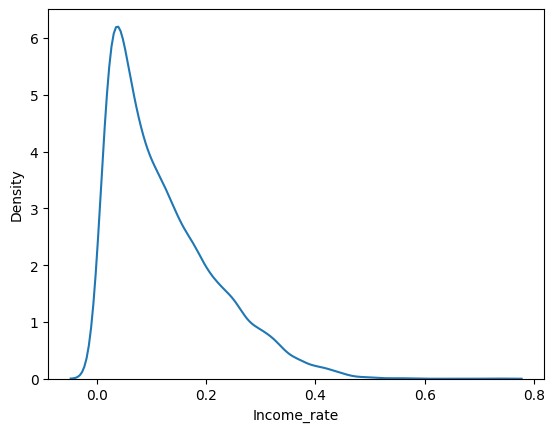

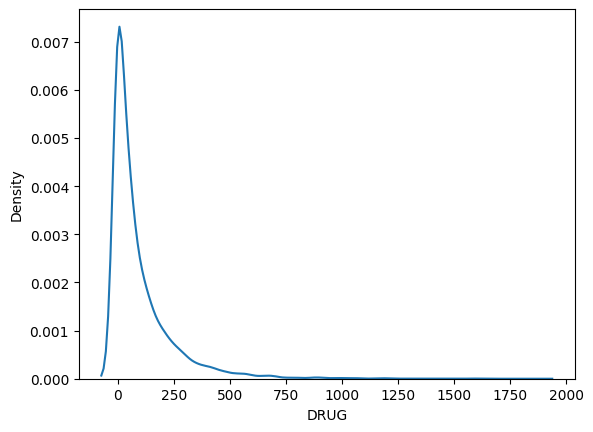

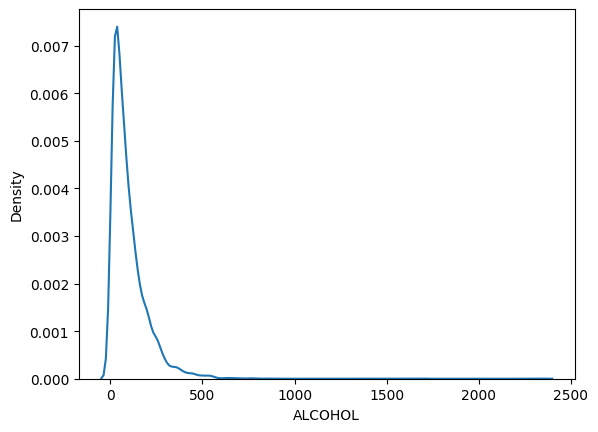

In [10]:
for column in list_of_columns:
    sns.kdeplot(data=df[column[1]])
    # Show the plot
    plt.show()

To get a visual cue of the relationship with things we also did a pair plot of all the numerical columns in the simd dataset

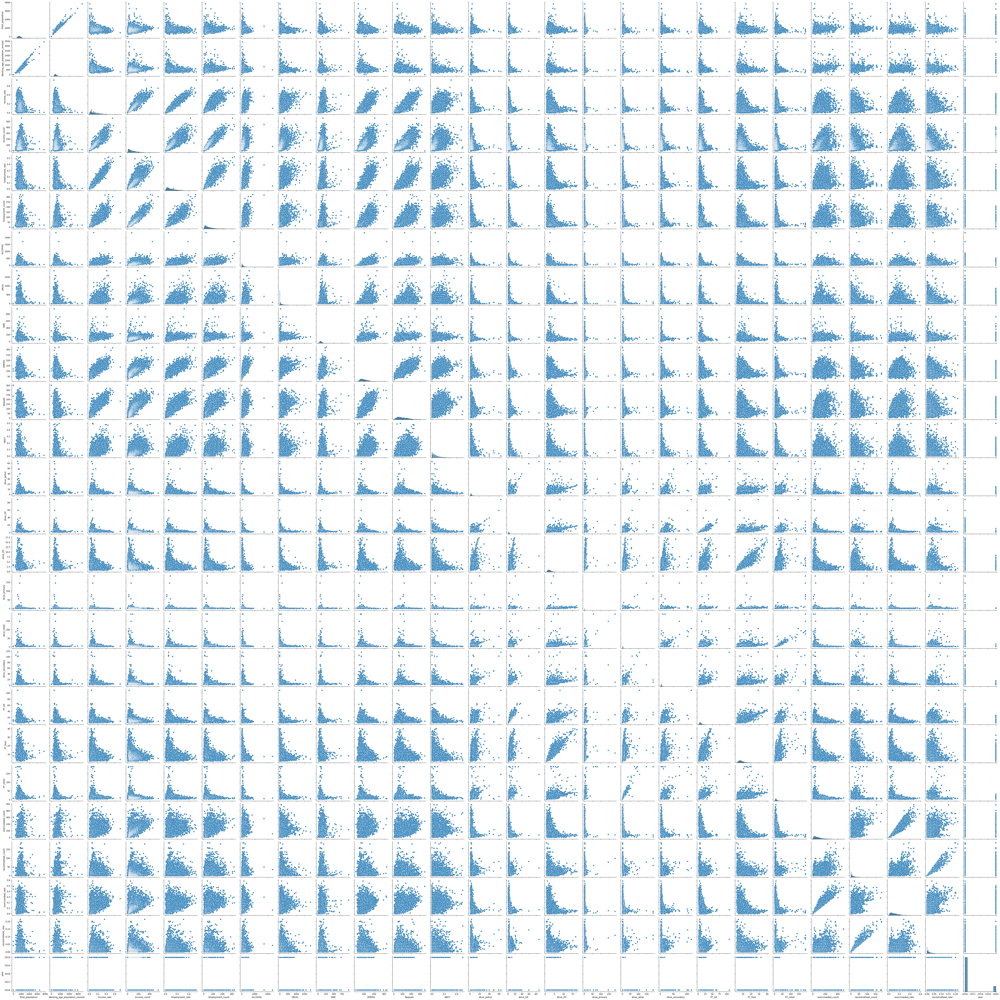

In [11]:
sns.pairplot(corr_simd)